# Non-Linear Optimization: Multivariable Functions
In this exercise, the goal is to minimize the function

$$
f(x, y) = e^{-x^2 - y^2} \sin(x) \cos(y),
$$
which combines exponential decay with sinusoidal variations. This makes it a compelling case for gradient descent optimization.
Unlike typical loss functions used in machine learning, where minimization is performed with respect to model parameters and data, here the aim is directly to find the values of $x$ and $y$ that minimize $f(x, y)$. In this context, $f(x, y)$ serves as a measure of error when evaluated with respect to the model parameters. Besides $x$ and $y$ are not treated as model parameters but simply as variables within the mathematical function.
## Steps
The following steps will be needed
- Compute partial derivatives to calculate the gradient in a point.
- Calculating forward (prediction) and backward (gradient steps) passes of the function.
- Iteratively using the forward and backward passes to optimize the function.


<article class="message">
    <div class="message-body">
        <strong>List of individual tasks</strong>
        <ul style="list-style: none;">
            <li>
            <a href="#forward">Task 1: Forward pass</a>
            </li>
            <li>
            <a href="#testing">Task 2: Explain the function</a>
            </li>
            <li>
            <a href="#partial">Task 3: Backward pass pen and paper</a>
            </li>
            <li>
            <a href="#partial1">Task 4: Backward implementation</a>
            </li>
            <li>
            <a href="#partial2">Task 5: Gradient descent</a>
            </li>
            <li>
            <a href="#plotting">Task 6: Optimization path</a>
            </li>
            <li>
            <a href="#reflection">Task 7: Reflection</a>
            </li>
        </ul>
    </div>
</article>

## Class Implementation
The function $f(x, y)$ and its gradient descent optimization will be implemented within the `ExpTrig`
 class defined in the cell below
The class includes the following methods, which must be implemented in the subsequent tasks.
1. `forward`
  must return the function value of `f(x,y)`
 e.g., the predictions
2. `df_dx`
  must return the partial derivative of the function with respect to `x`

3. `df_dy`
 must return the partial derivative of the function with respect to `y`

4. `backward`
 must return the gradient of `f(x,y)`
 as a tuple `(df_dx, df_dy)`
. The naming 'backward' is used due to its reference to backpropagation.
5. `display_function`
 makes a figure of the function defined in `forward`
.



In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

class ExpTrig:

    # Simply the prediction of the model
    def forward(self, x, y):
        """
        Args:
        x: x-values (Can be single float or 1D array)
        y: y-values (Can be single float or 1D array)

        Returns:
        The function values of f (size-like x and y)
        """
        return np.exp(-x**2 - y**2) * np.sin(x) * np.cos(y)

    # Partial derivative of the function with respect to x
    def df_dx(self, x, y):
        """
        Args:
        x: x-values (Can be single float or 1D numpy array)
        y: y-values (Can be single float or 1D numpy array)

        Returns:
        The partial derivative of f with respect to x (size-like x and y)
        """
        exp_term = np.exp(-x**2 - y**2)
        sin_term = np.sin(x)
        cos_term = np.cos(y)
        return exp_term * (-2 * x * sin_term * cos_term + cos_term * np.cos(x))

    # Partial derivative of the function with respect to y
    def df_dy(self, x, y):
        """
        Args:
        x: x-values (Can be single float or 1D numpy array)
        y: y-values (Can be single float or 1D numpy array)

        Returns:
        The partial derivative of f with respect to y (size-like x and y)
        """
        exp_term = np.exp(-x**2 - y**2)
        sin_term = np.sin(x)
        cos_term = np.cos(y)
        return exp_term * (-2 * y * sin_term * cos_term - sin_term * np.sin(y))

    # Getting the gradient at specific points, to figure out step size and direction.
    def backward(self, x, y):
        """
        args:
        x: x-values
        y: y-values
        Returns:
        Partial derivatives of the function (i.e., the gradient) as a tuple
        """
        df_dx = self.df_dx(x, y)
        df_dy = self.df_dy(x, y)
        return df_dx, df_dy

    def display_function(self):
        x = np.linspace(-2, 2, 400)
        y = np.linspace(-2, 2, 400)
        x, y = np.meshgrid(x, y)

        z = self.forward(x, y)

        # Create a 3D plot
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection='3d')
        ax.plot_surface(x, y, z, cmap='viridis', alpha=0.8)
        ax.set_xlabel('X axis')
        ax.set_ylabel('Y axis')
        ax.set_zlabel('f(x, y)')
        ax.set_title('Surface of f(x, y) = e^{-x^2 - y^2} sin(x) cos(y)')
        plt.show()



---
**Task 1 (easy): Forward pass👩‍💻**
1. Implement the  `forward`
 function in the class.
2. Run the cell below to visualize the function. 


---

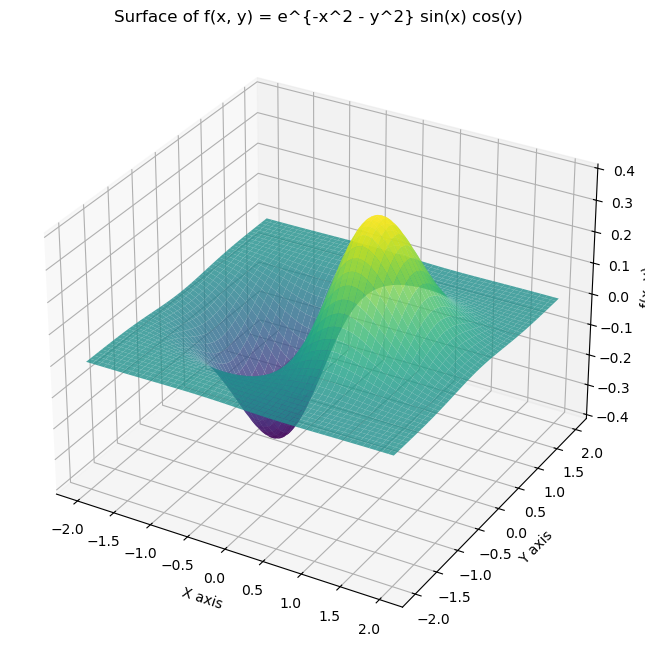

In [5]:
# Grid of x, y points
f = ExpTrig()

f.display_function()


---
**Task 2 (easy): Explain the function💡**
Use the plot to identify the minima of the function and discuss potential challenges associated with gradient-based optimization.

---

## Task 2 reflection

**Minima:** 0.75, 0.75

**Potential challenges with gradient-based optimization:**
* Some areas in the function are quite flat. This will result in very small steps. So with a combination of low learning rate and few epochs, we won't converge at the global minima.
* Some areas are very steep. If learning rate is too high this could result in too big a step, resulting in oscillating between two cliffs.

## Gradient Descent
**Gradient Descent** is an iterative optimization method that updates input variables step by step by using the gradient of a function with respect to these variables. The updates are made by moving in the negative direction of the gradient, which corresponds to the direction of the steepest decrease in the function's value. The update rule is given by:

$$ x_{t+1} = x_t - \lambda \nabla_x f(x_t) $$
where:
- $x_t \in \mathbb{R}^n$ represents the input to the function $f(x)$ at iteration $t$,
- $x_{t+1}$ is the updated input at iteration $t+1$,
- $\nabla_x f(x_t)$ is the gradient of $f$ with respect to $x$ at $x_t$,
- $\lambda$ is the learning rate, which controls the size of each step, and
- $t$ is the current iteration step.


---
**Task 3 (medium): Backward pass pen and paper♾️**
On a piece of paper, show that the partial derivatives of the function $f(x, y)$ with respect to $x$ and $y$, i.e.,
$\frac{\partial f}{\partial x} \quad \text{and} \quad \frac{\partial f}{\partial y}$ are 

$$

\frac{\partial f}{\partial x} = -2xe^{-x^2 - y^2} \sin(x) \cos(y) + e^{-x^2 - y^2} \cos(x) \cos(y) 

$$

$$

\frac{\partial f}{\partial y} = -2ye^{-x^2 - y^2} \sin(x) \cos(y) - e^{-x^2 - y^2} \sin(x) \sin(y) 

$$

**Hint**
Recall the _chain rule_ and and _product rule_ for finding the partial derivatives for $x$ and $y$.


---

## Task 3 reflection
**Product rule in words:** “Equals f mærke x, gange g(x) + f(x) gange g mærke x”

**Chain rule in words:** (Derivative of outside function leaving inside alone) times (derivative of inside function)

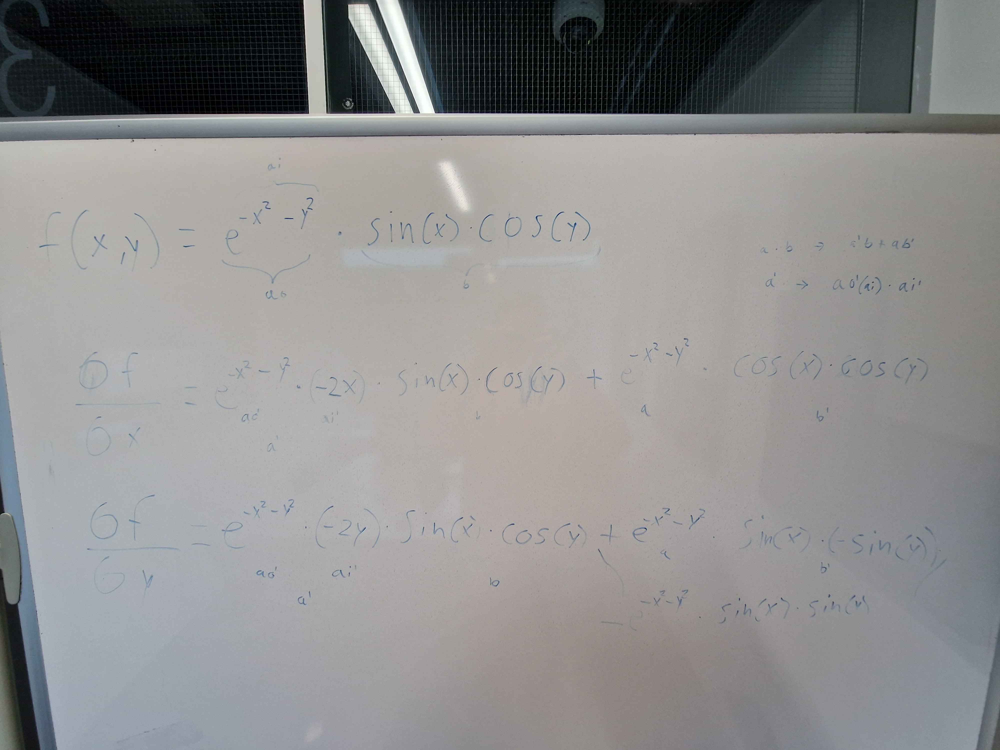


---
**Task 4 (medium): Backward implementation👩‍💻**
Implement the following functions in the `ExpTrig`
 class:
1. `df_dx`
 and `df_dy`
  which return the values of the partial derivatives for a given `x`
 and `y`
. See the results in the previous task (in case you didn't complete the previous task the result is given there)


2. `backward`
 method so that it returns the gradient evaluated at a given x, y.



---

## Optimization Method

---
**Task 5 (medium): Gradient descent👩‍💻**
The following steps outline the implementation of gradient descent for the function $f(x, y)$ , which is defined in the `ExpTrig`
 class. The implementation of `optimize_function`
 method involves several tasks that must be completed. Implement each of these steps in the cell below.
1. **Initialize Coordinates**: Start by initializing `x`
 and `y`
 as `start_x`
 and `start_y`
, respectively. These are your starting guesses for the optimization.

2. **Initialize History Lists**: Create two lists, `x_all`
 and `y_all`
, to record the coordinates visited during the optimization.

3. **Start Gradient Descent Loop**: Implement a for-loop that iterates a specified number of times. Within each iteration:
    - Use the `backward`
 method of `func`
 to compute the gradients at the current estimate `(x, y)`
.
    - Update `x`
 and `y`
 using the optimization steps by taking a step in the direction opposite to the gradient, scaled by the `learning_rate`
. 
    - Logging (optional): Add a logging mechanism to display the current state of the optimization. For example, print the iteration number, values `x`
, `y`
, and the function value, $f(x,y)$ at these coordinates every 25 iterations.
    - Record History: append the current values of `x`
 and `y`
 to `x_all`
 and `y_all`
, respectively.


4. **Return the Result**: the function should return `x_all`
 and `y_all`
.



---

In [6]:
def optimize_function(func, start_x, start_y, learning_rate, iterations):
    """
    Optimize a given function using gradient descent.

    Args:
    - func (Function): A function object that must have 'forward' and 'backward' methods.
                       The 'forward' method computes the function value at a given point (x, y),
                       and the 'backward' method computes the gradient at that point.
    - start_x (float): The starting x-coordinate for the optimization.
    - start_y (float): The starting y-coordinate for the optimization.
    - learning_rate (float): The step size for each iteration in the gradient descent.
    - iterations (int): The total number of iterations for the optimization process.

    Returns:
    - x_all (list of float): List of all x-coordinates of the points visited during the optimization.
    - y_all (list of float): List of all y-coordinates of the points visited during the optimization.

    This function performs gradient descent on the provided function object. Starting from
    (start_x, start_y), it iteratively moves in the direction opposite to the gradient,
    with step sizes determined by the learning rate. The function's value and current
    coordinates are printed every 25 iterations. The function returns the history of
    coordinates visited during the optimization.
    """
    # Initialize coordinates
    x, y = start_x, start_y

    # Initialize history lists
    x_all, y_all = [x], [y]

    # Start Gradient Descent Loop
    for i in range(iterations):
        # Compute the gradients
        df_dx, df_dy = func.backward(x, y)

        # Update coordinates
        x -= learning_rate * df_dx
        y -= learning_rate * df_dy

        # Record history
        x_all.append(x)
        y_all.append(y)

        # Optional logging every 25 iterations
        if i % 25 == 0 or i == iterations - 1:
            f_value = func.forward(x, y)
            print(f"Iteration {i}: x = {x:.4f}, y = {y:.4f}, f(x, y) = {f_value:.4f}")

    return x_all, y_all


# Example optimization
x_arr, y_arr = optimize_function(ExpTrig(), start_x=-1.5, start_y=-1., learning_rate=0.2, iterations=100)

Iteration 0: x = -1.4878, y = -0.9851, f(x, y) = -0.0228
Iteration 25: x = -0.6685, y = -0.0596, f(x, y) = -0.3943
Iteration 50: x = -0.6533, y = -0.0001, f(x, y) = -0.3967
Iteration 75: x = -0.6533, y = -0.0000, f(x, y) = -0.3967
Iteration 99: x = -0.6533, y = -0.0000, f(x, y) = -0.3967



---
**Task 6 (medium): Optimization path💡**
1. Run the cell below to plot the optimization path of the `optimize_function`
.
2. Identify areas where the optimization slows down or oscillates and explain why might these occur?
3. How might a different learning rate affect the optimization path? Consider the possibilities of paths that overshoot, oscillate, or stagnate.
4. How does the shape of the surface (e.g., steep slopes or flat regions) influence the behavior of the optimization path?


---

In [7]:
# FOR VISUAL RESULTS SEE TASK 7

def plot_optimization_path(func, x_values, y_values, start_x, start_y, learning_rate):
    x = np.linspace(-2, 2, 400)
    y = np.linspace(-2, 2, 400)
    x, y = np.meshgrid(x, y)
    z = func.forward(x, y)

    x_values = np.array(x_values)
    y_values = np.array(y_values)
    z_values = func.forward(x_values, y_values)

    # Plot the optimization path
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(x, y, z, cmap='viridis', alpha=0.6)
    ax.plot(x_values, y_values, z_values, marker='o', color='r', markersize=5, label='Optimization Path')
    ax.plot(x_values[-1], y_values[-1], z_values[-1], marker='x', color='b', markersize=10, label='Final Point')
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('f(x, y)')
    ax.set_title(f"Optimization Path (x0={start_x}, y0={start_y}, lr={learning_rate})")
    ax.legend()
    plt.show()


---
**Task 7 (medium): Reflection💡**
Assess the proficiency of the of the gradient descent algorithm
1. Use gradient descent to find the minimum using the following starting points:


$$
x_{0}=1.5, y_{0}=1.5 
$$

$$
x_{0}=-1.5, y_{0}=-1.5
$$

$$
x_{0}=-1.0, y_{0}=1.3
$$

$$
x_{0}=1.2, y_{0}=-1.5
$$
2. In the cell below describe the main observations from these optimizations.
3. Explain why the optimization process sometimes fails to find the **global** minimum?
4. Use different learning rates (try 0.1, 0.5, 1.0) and discuss how they affect the results.
5. List two issues commonly encountered in gradient descent optimization and provide a potential solution for each problem:    - Describe each issue and explain why it poses a challenge.
    - Propose a potential solution to address each issue effectively.




---


Starting optimization with x0=-1.5, y0=-1, learning_rate=0.1
Iteration 0: x = -1.4939, y = -0.9926, f(x, y) = -0.0218
Iteration 25: x = -1.1963, y = -0.6607, f(x, y) = -0.1135
Iteration 50: x = -0.6738, y = -0.0678, f(x, y) = -0.3935
Iteration 75: x = -0.6534, y = -0.0029, f(x, y) = -0.3966
Iteration 99: x = -0.6533, y = -0.0001, f(x, y) = -0.3967


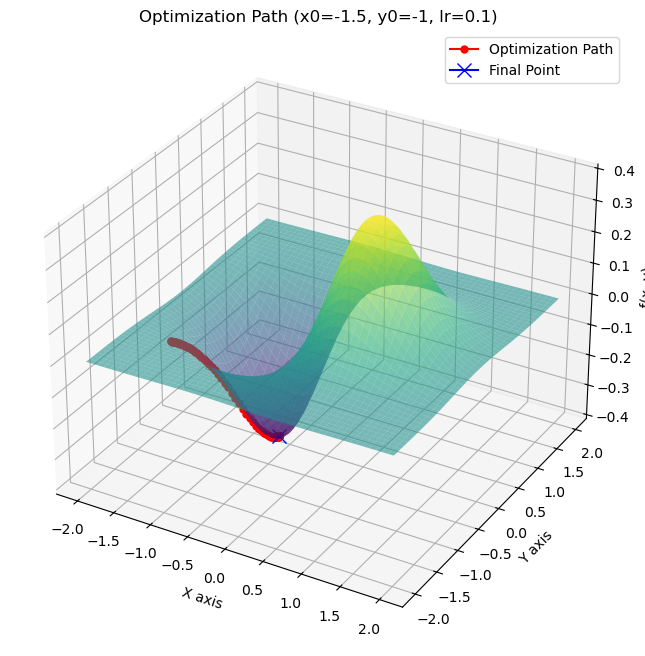


Starting optimization with x0=-1.5, y0=-1, learning_rate=0.5
Iteration 0: x = -1.4694, y = -0.9628, f(x, y) = -0.0260
Iteration 25: x = -0.6533, y = -0.0000, f(x, y) = -0.3967
Iteration 50: x = -0.6533, y = -0.0000, f(x, y) = -0.3967
Iteration 75: x = -0.6533, y = -0.0000, f(x, y) = -0.3967
Iteration 99: x = -0.6533, y = -0.0000, f(x, y) = -0.3967


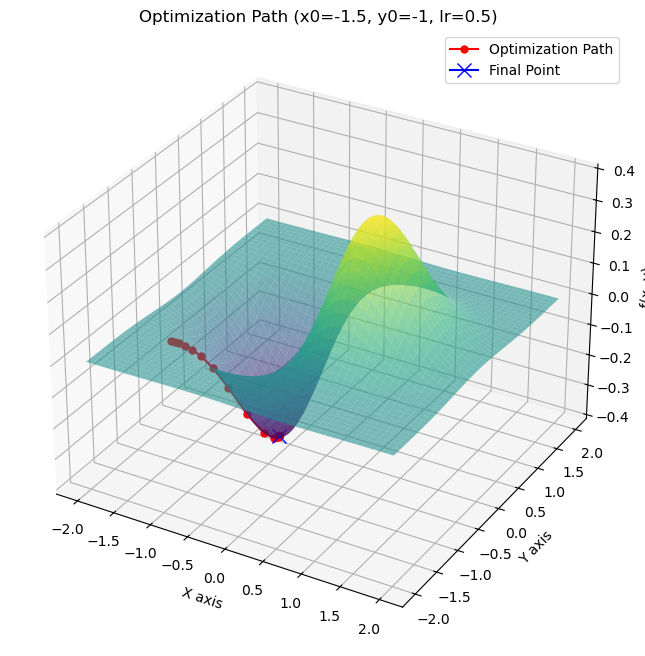


Starting optimization with x0=-1.5, y0=-1, learning_rate=1.0
Iteration 0: x = -1.4388, y = -0.9257, f(x, y) = -0.0319
Iteration 25: x = -0.6516, y = 0.0000, f(x, y) = -0.3967
Iteration 50: x = -0.6533, y = -0.0000, f(x, y) = -0.3967
Iteration 75: x = -0.6533, y = 0.0000, f(x, y) = -0.3967
Iteration 99: x = -0.6533, y = 0.0000, f(x, y) = -0.3967


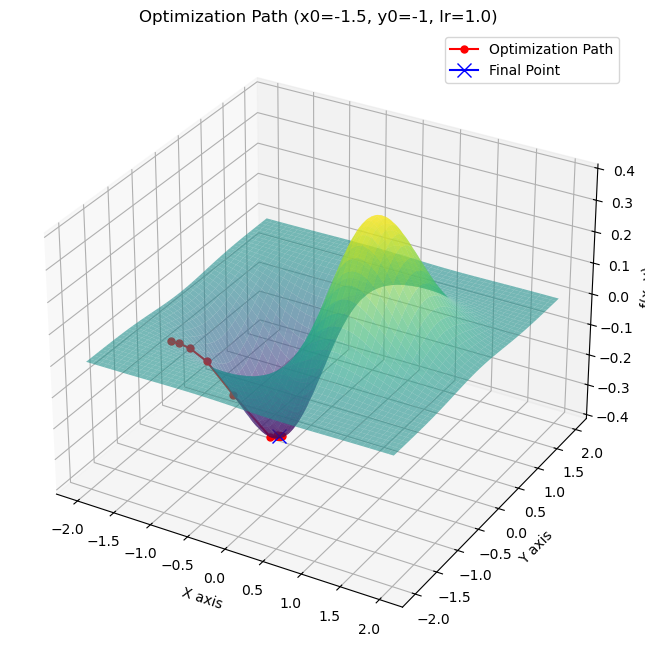


Starting optimization with x0=1.5, y0=1.5, learning_rate=0.1
Iteration 0: x = 1.5002, y = 1.5013, f(x, y) = 0.0008
Iteration 25: x = 1.5044, y = 1.5318, f(x, y) = 0.0004
Iteration 50: x = 1.5063, y = 1.5576, f(x, y) = 0.0001
Iteration 75: x = 1.5064, y = 1.5798, f(x, y) = -0.0001
Iteration 99: x = 1.5054, y = 1.5985, f(x, y) = -0.0002


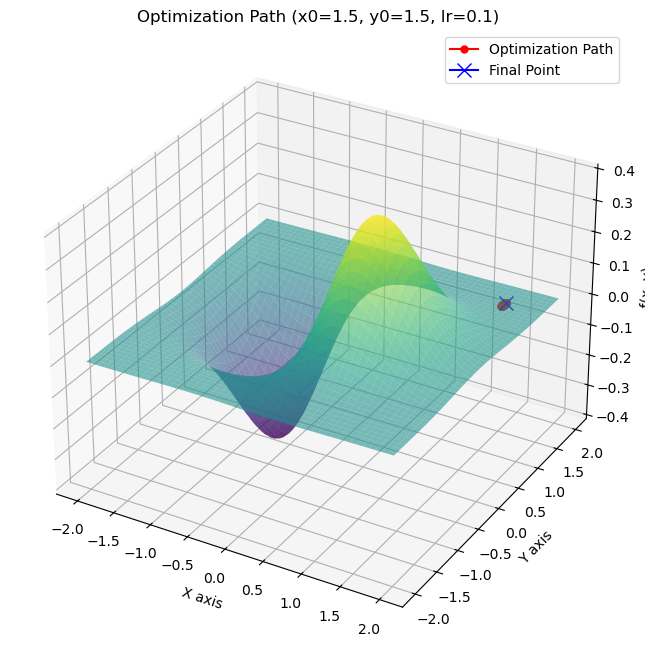


Starting optimization with x0=1.5, y0=1.5, learning_rate=0.5
Iteration 0: x = 1.5011, y = 1.5067, f(x, y) = 0.0007
Iteration 25: x = 1.5033, y = 1.6199, f(x, y) = -0.0004
Iteration 50: x = 1.4828, y = 1.6833, f(x, y) = -0.0007
Iteration 75: x = 1.4531, y = 1.7254, f(x, y) = -0.0009
Iteration 99: x = 1.4194, y = 1.7545, f(x, y) = -0.0011


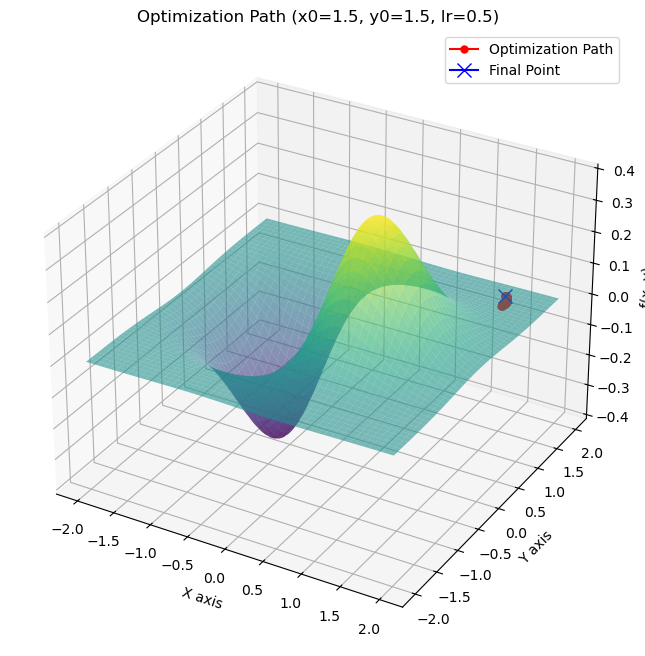


Starting optimization with x0=1.5, y0=1.5, learning_rate=1.0
Iteration 0: x = 1.5023, y = 1.5134, f(x, y) = 0.0006
Iteration 25: x = 1.4824, y = 1.6863, f(x, y) = -0.0007
Iteration 50: x = 1.4173, y = 1.7572, f(x, y) = -0.0011
Iteration 75: x = 1.3356, y = 1.7957, f(x, y) = -0.0014
Iteration 99: x = 1.2466, y = 1.8167, f(x, y) = -0.0018


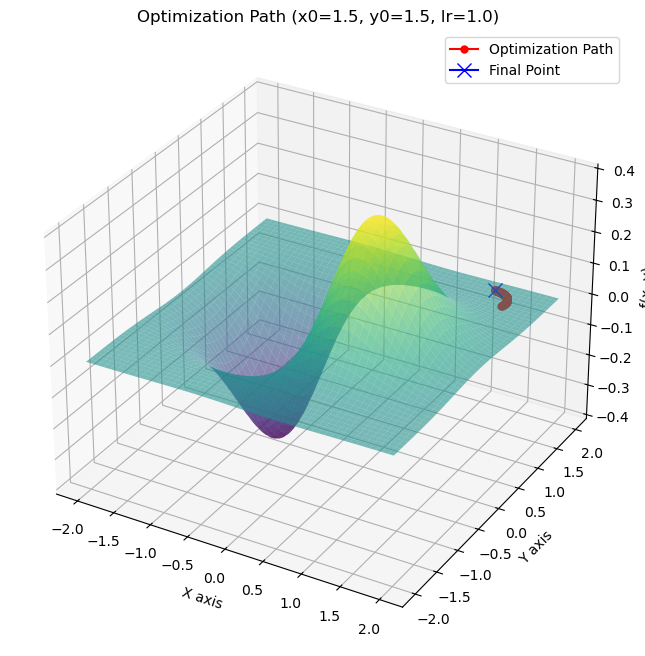


Starting optimization with x0=-1.5, y0=-1.5, learning_rate=0.1
Iteration 0: x = -1.4998, y = -1.4987, f(x, y) = -0.0008
Iteration 25: x = -1.4920, y = -1.4613, f(x, y) = -0.0014
Iteration 50: x = -1.4790, y = -1.4141, f(x, y) = -0.0024
Iteration 75: x = -1.4568, y = -1.3511, f(x, y) = -0.0042
Iteration 99: x = -1.4188, y = -1.2631, f(x, y) = -0.0081


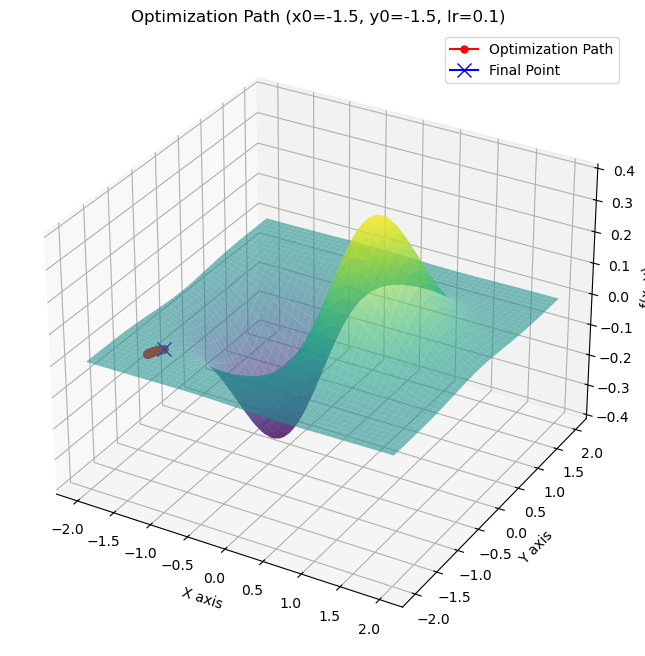


Starting optimization with x0=-1.5, y0=-1.5, learning_rate=0.5
Iteration 0: x = -1.4989, y = -1.4933, f(x, y) = -0.0009
Iteration 25: x = -1.3330, y = -1.0964, f(x, y) = -0.0226
Iteration 50: x = -0.6533, y = -0.0000, f(x, y) = -0.3967
Iteration 75: x = -0.6533, y = -0.0000, f(x, y) = -0.3967
Iteration 99: x = -0.6533, y = -0.0000, f(x, y) = -0.3967


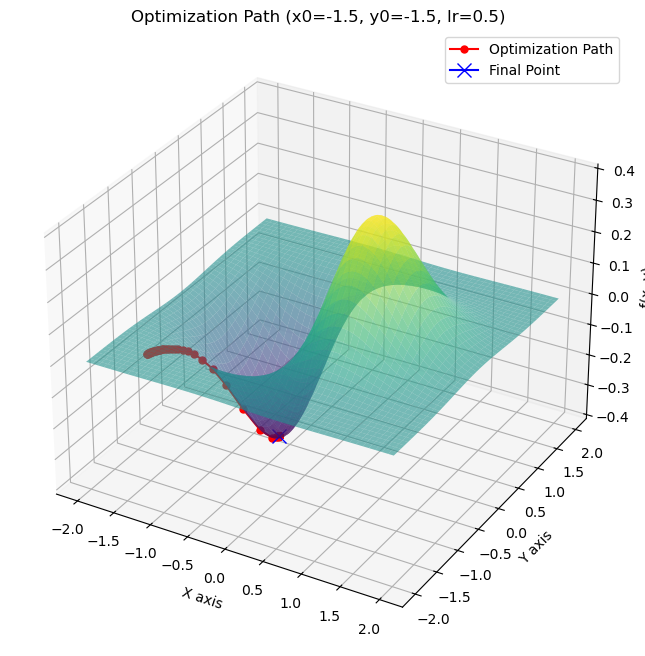


Starting optimization with x0=-1.5, y0=-1.5, learning_rate=1.0
Iteration 0: x = -1.4977, y = -1.4866, f(x, y) = -0.0010
Iteration 25: x = -0.6673, y = -0.0000, f(x, y) = -0.3965
Iteration 50: x = -0.6529, y = 0.0000, f(x, y) = -0.3967
Iteration 75: x = -0.6533, y = -0.0000, f(x, y) = -0.3967
Iteration 99: x = -0.6533, y = -0.0000, f(x, y) = -0.3967


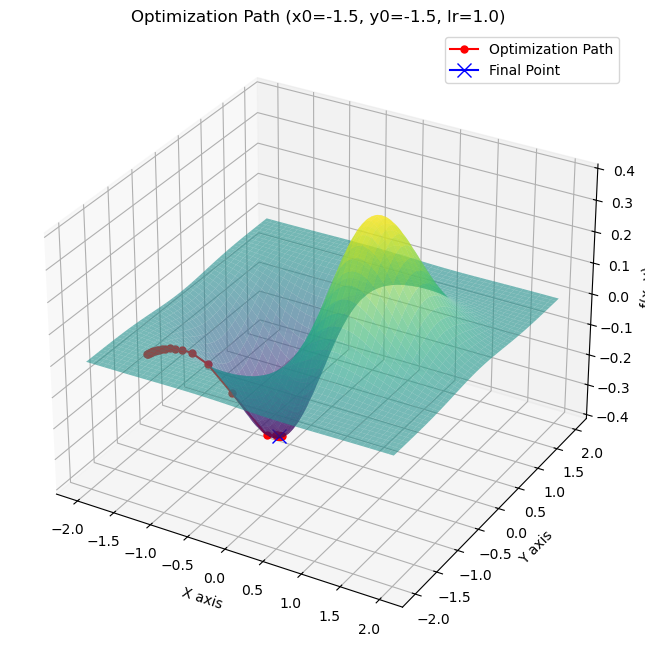


Starting optimization with x0=-1.0, y0=1.3, learning_rate=0.1
Iteration 0: x = -0.9979, y = 1.2905, f(x, y) = -0.0162
Iteration 25: x = -0.8708, y = 0.8416, f(x, y) = -0.1176
Iteration 50: x = -0.6598, y = 0.0826, f(x, y) = -0.3926
Iteration 75: x = -0.6533, y = 0.0035, f(x, y) = -0.3966
Iteration 99: x = -0.6533, y = 0.0002, f(x, y) = -0.3967


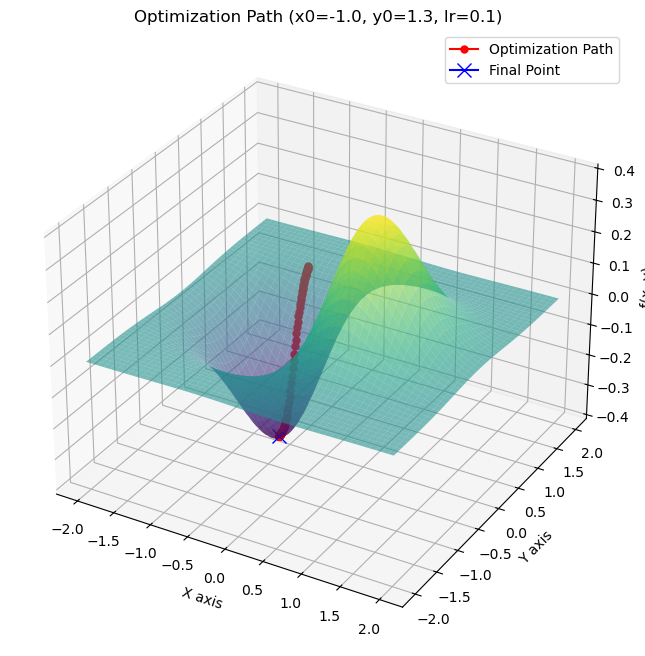


Starting optimization with x0=-1.0, y0=1.3, learning_rate=0.5
Iteration 0: x = -0.9896, y = 1.2526, f(x, y) = -0.0204
Iteration 25: x = -0.6533, y = 0.0000, f(x, y) = -0.3967
Iteration 50: x = -0.6533, y = 0.0000, f(x, y) = -0.3967
Iteration 75: x = -0.6533, y = 0.0000, f(x, y) = -0.3967
Iteration 99: x = -0.6533, y = 0.0000, f(x, y) = -0.3967


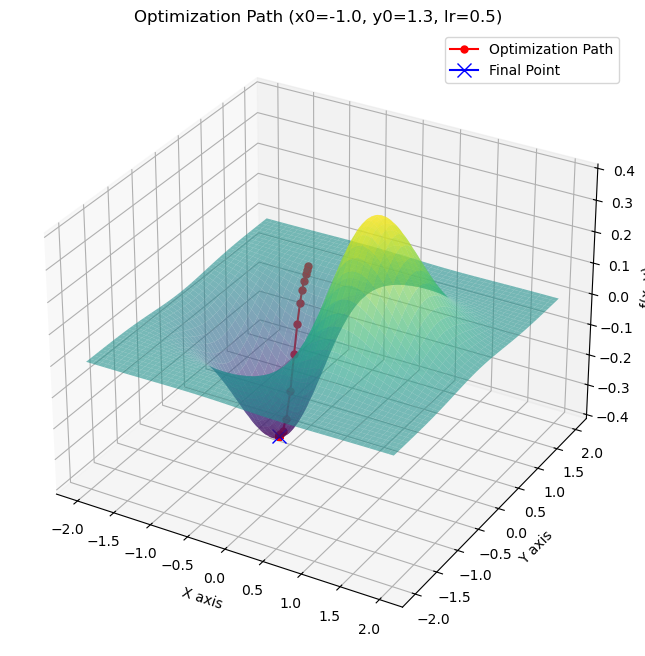


Starting optimization with x0=-1.0, y0=1.3, learning_rate=1.0
Iteration 0: x = -0.9793, y = 1.2052, f(x, y) = -0.0266
Iteration 25: x = -0.6534, y = -0.0000, f(x, y) = -0.3967
Iteration 50: x = -0.6533, y = 0.0000, f(x, y) = -0.3967
Iteration 75: x = -0.6533, y = -0.0000, f(x, y) = -0.3967
Iteration 99: x = -0.6533, y = -0.0000, f(x, y) = -0.3967


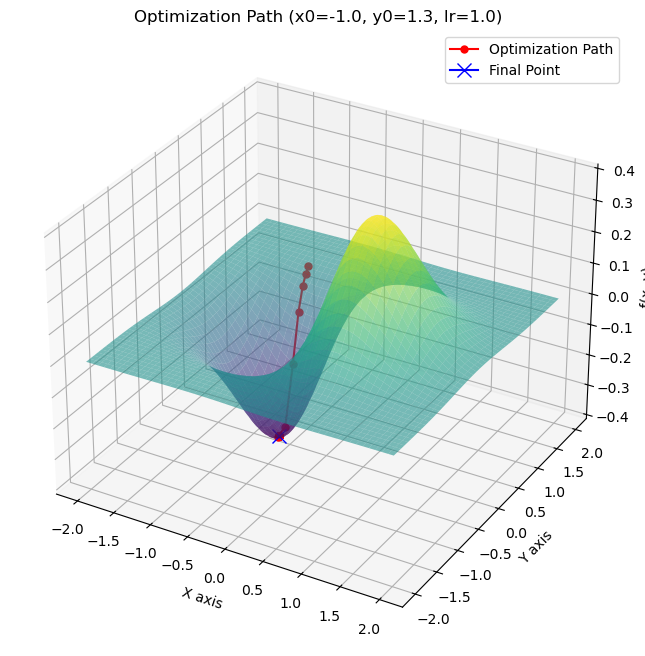


Starting optimization with x0=1.2, y0=-1.5, learning_rate=0.1
Iteration 0: x = 1.2003, y = -1.5028, f(x, y) = 0.0016
Iteration 25: x = 1.2045, y = -1.5615, f(x, y) = 0.0002
Iteration 50: x = 1.2034, y = -1.6045, f(x, y) = -0.0006
Iteration 75: x = 1.1994, y = -1.6377, f(x, y) = -0.0010
Iteration 99: x = 1.1938, y = -1.6634, f(x, y) = -0.0013


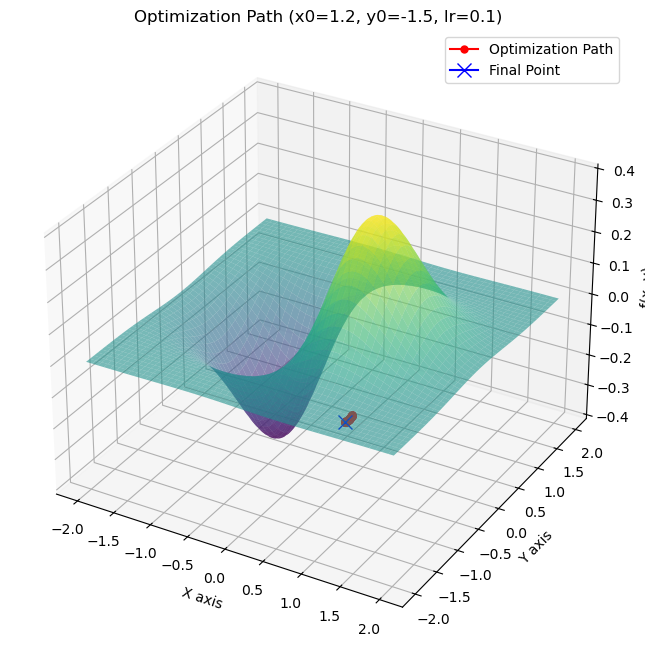


Starting optimization with x0=1.2, y0=-1.5, learning_rate=0.5
Iteration 0: x = 1.2017, y = -1.5141, f(x, y) = 0.0013
Iteration 25: x = 1.1861, y = -1.6914, f(x, y) = -0.0016
Iteration 50: x = 1.1420, y = -1.7586, f(x, y) = -0.0021
Iteration 75: x = 1.0931, y = -1.7930, f(x, y) = -0.0024
Iteration 99: x = 1.0456, y = -1.8117, f(x, y) = -0.0026


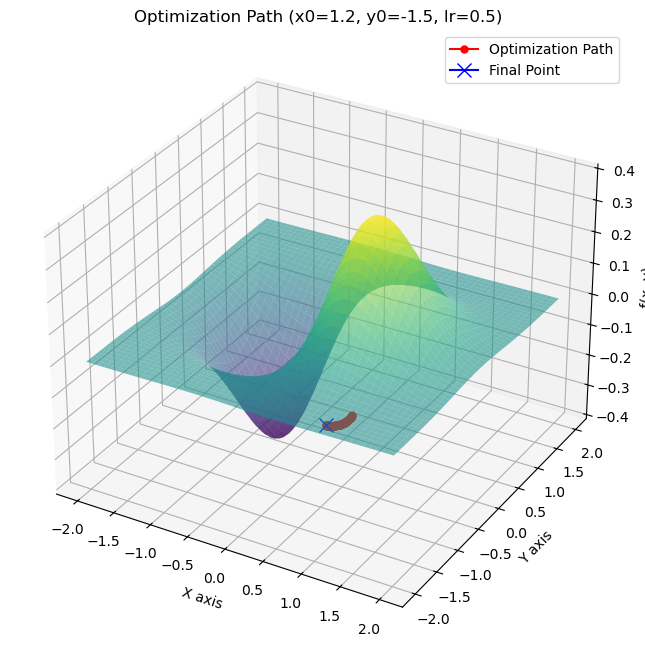


Starting optimization with x0=1.2, y0=-1.5, learning_rate=1.0
Iteration 0: x = 1.2033, y = -1.5282, f(x, y) = 0.0009
Iteration 25: x = 1.1410, y = -1.7620, f(x, y) = -0.0021
Iteration 50: x = 1.0424, y = -1.8136, f(x, y) = -0.0026
Iteration 75: x = 0.9487, y = -1.8299, f(x, y) = -0.0030
Iteration 99: x = 0.8711, y = -1.8347, f(x, y) = -0.0032


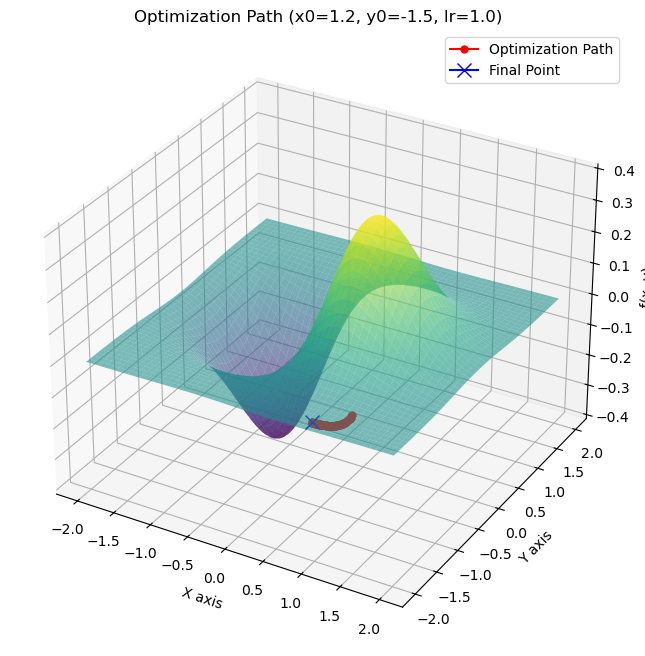

In [8]:
def run_experiments():
    # Task-specific starting points and learning rates
    starting_points = [
        (-1.5, -1),
        (1.5, 1.5),
        (-1.5, -1.5),
        (-1.0, 1.3),
        (1.2, -1.5)
    ]
    learning_rates = [0.1, 0.5, 1.0]
    iterations = 100

    # Run the experiments
    for start_x, start_y in starting_points:
        for lr in learning_rates:
            print(f"\nStarting optimization with x0={start_x}, y0={start_y}, learning_rate={lr}")
            x_arr, y_arr = optimize_function(ExpTrig(), start_x=start_x, start_y=start_y, learning_rate=lr, iterations=iterations)

            # Plot the optimization path
            plot_optimization_path(ExpTrig(), x_arr, y_arr, start_x, start_y, lr)


# Run all experiments
run_experiments()

## Task 7 reflection.

For more about potential challenges see task 2 reflection.

### Common Issues in Gradient Descent and Solutions
1. **Trapping in Local Minima**:
   - **Challenge**: If the graph has many local minima and only 1 global minima, gradient descent might get stuck in a local minima, and never find the global minima.
   - **Solution**: 
     - Stochastic Gradient Descent (SGD): Introduce randomness by evaluating gradients on mini-batches of data instead of the entire dataset. This randomness can help the optimizer escape local minima.
     - Momentum based optimization: The extra momentum might push it out of the local minima.

2. **Sensitivity to Learning Rate**:
   - **Challenge**: An inappropriate learning rate can lead to slow convergence or divergence.
   - **Solution**: We don't know the details, but in our slides it is mentioned that ADAM is an adaptive learning rate method, that could help this problem.
